# Misharin (GSE127803) - Annotation (of filtered data) using the Leiden algorithm
Mice aged 8-10 weeks were instilled intratracheally with control particles or crocidolite asbestos fibers to induce lung fibrosis. Lungs were then harvested at different time points (depending on the analysis method).
Single-cell RNA sequencing was done on a HiSeq 4000 instrument (Illumina) using Chromium Single Cell v2 Reagent Kit and Controller for the library preparation.

In [2]:
import helper_classes_DanielStrobl
import scanpy
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (15, 15)
scanpy.settings.verbosity = 0
scanpy.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [3]:
base = "GSE127803_RAW/"
output = "output/"

In [4]:
misharin_filtered = scanpy.read(output + 'misharin_Emma_processed_without_annotation.h5ad')

## Creating UMAP to annotate:

In [5]:
scanpy.pp.neighbors(misharin_filtered, n_pcs=30)
scanpy.tl.umap(misharin_filtered)

In [6]:
scanpy.tl.leiden(misharin_filtered)

In [7]:
scanpy.tl.leiden(misharin_filtered, key_added="leiden_res0_1", resolution=0.1)
scanpy.tl.leiden(misharin_filtered, key_added="leiden_res0_25", resolution=0.25)
scanpy.tl.leiden(misharin_filtered, key_added="leiden_res0_5", resolution=0.5)
scanpy.tl.leiden(misharin_filtered, key_added="leiden_res1", resolution=1.0)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: PendingDeprecationWarning: The get_cmap function will be deprecated in a future version. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  c

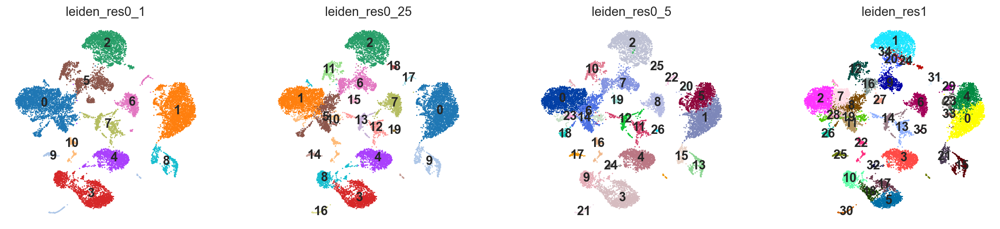

In [8]:
scanpy.pl.umap(
    misharin_filtered,
    color=["leiden_res0_1", "leiden_res0_25", "leiden_res0_5", "leiden_res1"],
    legend_loc="on data",
)

The Leiden algorithm with a resolution of 0.1 will be used for the coarse annotation, 0.25 for the finer one.

## Coarse annotation using the method **plot_markers()**:

Macrophages


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: PendingDeprecationWarning: The get_cmap function will be deprecated in a future version. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


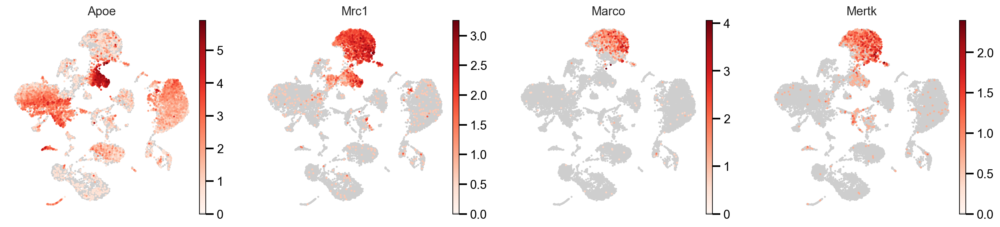

Monocytes


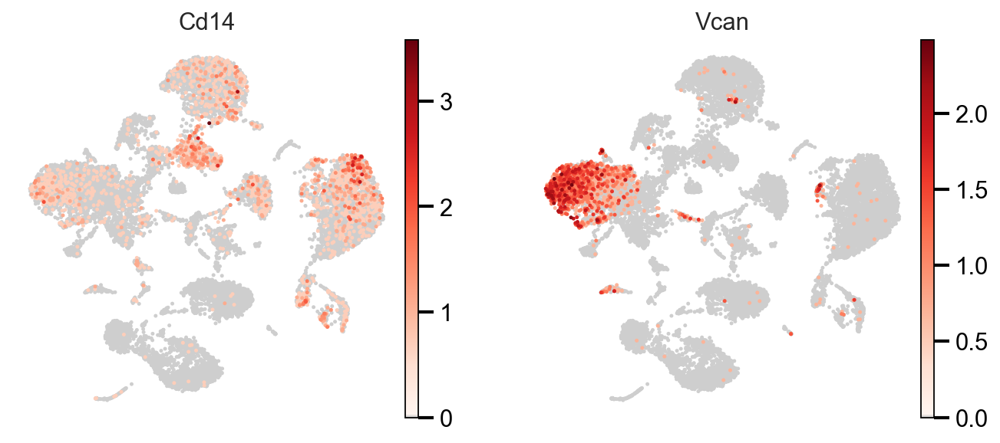

T-Cells


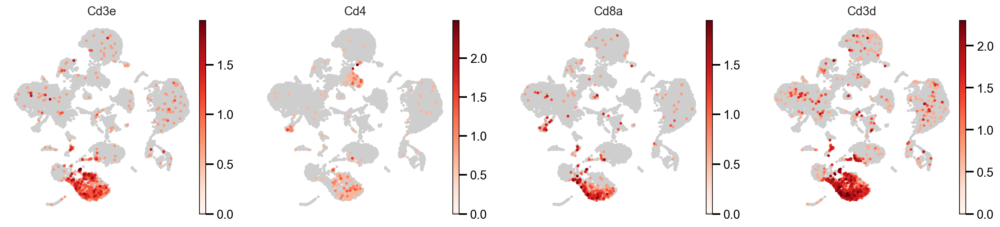

B-Cells


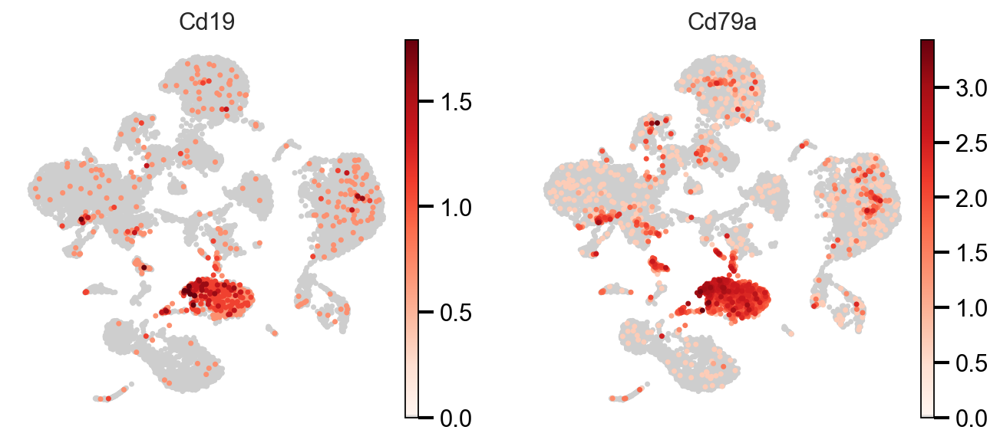

AT2


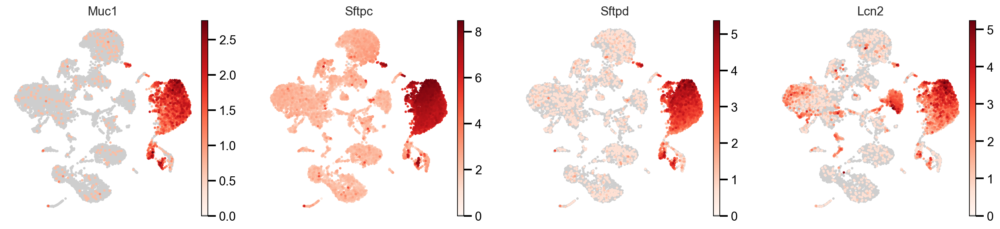

AT1


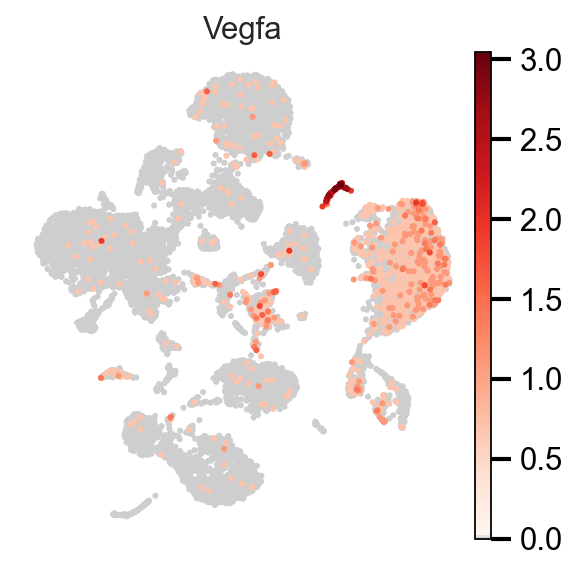

Krt8


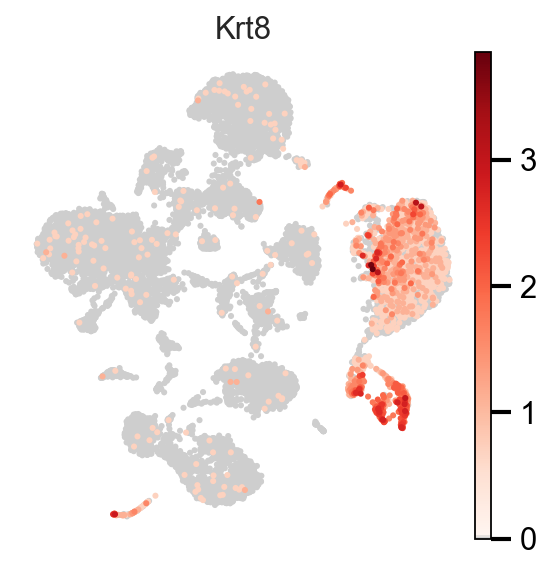

Endothelial


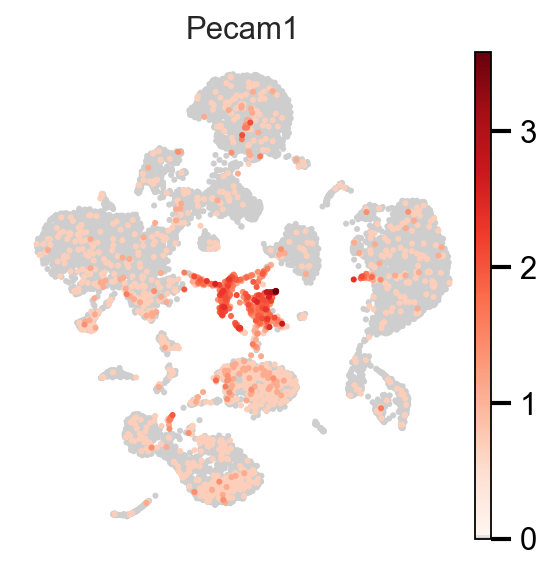

Fibroblasts


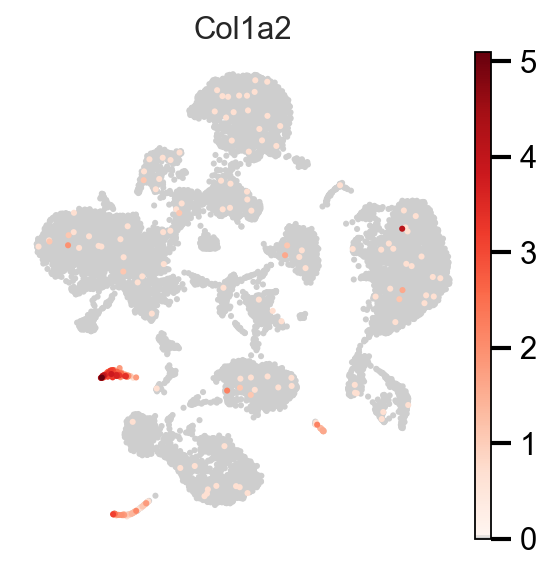

Myofibroblasts


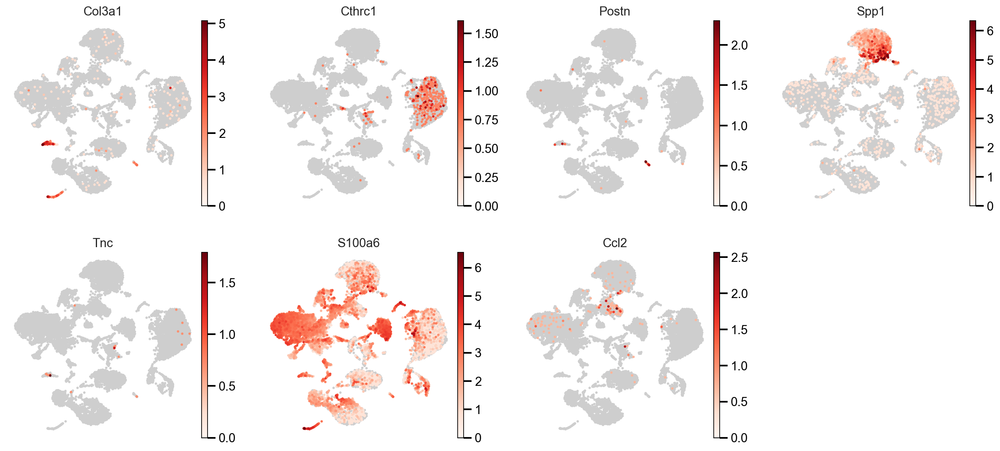

In [9]:
helper_classes_DanielStrobl.plot_markers(misharin_filtered)

In [19]:
cl_annotation_coarse = {
	"0": "Monocytes",
    "1": "AT2",
    "2": "Macrophages",
    "3": "T-cells",
    "4": "B-cells",
    "5": "Macrophages",
    "6": "AT1",   # only the small part ?
    "7": "Endothelial",
    "8": "Krt8",
    "9": "Fibroblasts",   # + Myofibroblasts ?
    "10": "10"
}

In [20]:
misharin_filtered.obs["manual_celltype_annotation_coarse"] = misharin_filtered.obs.leiden_res0_1.map(cl_annotation_coarse).astype("category")

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: PendingDeprecationWarning: The get_cmap function will be deprecated in a future version. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


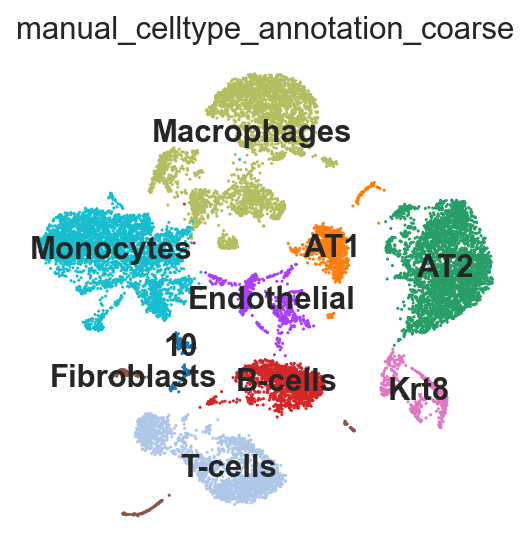

In [21]:
scanpy.pl.umap(misharin_filtered, color="manual_celltype_annotation_coarse", legend_loc="on data")

## Defining more marker genes:
Source: https://docs.google.com/spreadsheets/d/1nUMZA_I9bliJX1-x_-KRqKrF_6e229gx_l_GtOwt0rU/edit#gid=0

In [18]:
marker_genes = {
    "Neutrophil": ["S100a8", "S100a9"],
    "AT1": ["S100a6", "Ager", "Pdpn", "Vegfa"],   # Vegfa added from Helperclass
    "AT2": ["Muc1", "Sftpc", "Sftpd", "Cxcl15", "Lcn2"],   # Lcn2 added from Helperclass
    "Transitioning epi": ["Krt8", "Krt18"],
    "Club": ["Scgb1a1", "Scgb3a2"],
    "Goblet": ["Muc5ac", "Muc5b"],
    "Ciliated": ["Foxj1", "Pifo"],
    "T-Cells": ["Cd3e", "Cd4", "Cd8a", "Cd3d"],   # Cd3d added from Helperclass
    "NK-Cells": ["Tyrobp", "Gzma", "Nkg7"],
    "B-Cells": ["Cd79a", "Cd19", "Ms4a1"],
    "Monocytes": ["Cd14", "Vcan", "FCGR3A (CD16)", "Fcgr4"],
    "Plasmacytoid dendridic": ["Siglech", "Clec4c"],
    "Interstitial macrophages": ["Trem2", "C1qa"],
    "Alveolar macrophage": ["Marco", "Chil3", "Fabp4"],
    "Classical Monocyte": ["F13a1", "Ly6c2"],
    "Nonclassical monocyte": ["Treml4", "Fcgr3"],
    "Dendridic": ["Clec9a", "H2-Aa"],
    "Ccr7 dendridic": ["Ccr7"],
    "Basophil": ["Cpa3"],
    "SMCs": ["Acta2", "Tagln"],
    "Myofibroblasts": ["Cthrc1", "Spp1", "Pdgfra", "Col3a1", "Postn", "Tnc", "S100a6", "Ccl2"],   # Col3a1, Postn, Tnc, S100a6, Ccl2 added from Helperclass
    "Fibroblasts": ["Col1a2"],
    "Mesothelial": ["Msln", "Upk3b"],
    "Pericytes": ["Vtn", "Mcam"],
    "Peribronchiolar fibroblasts": ["Hhip", "Aspn"],
    "Alveolar fibroblasts": ["Npnt"],
    "Adventitial fibroblasts": ["Dcn", "Pi16"],
    "Endothelial": ["Pecam1", "Ly6c1"],
    "Aerocyte": ["Car4", "Ednrb"],
    "Vein endo": ["Slc6a2", "Vegfc"],
    "Lymphatic endothelial": ["Pdpn"],
    "Macrophages - Misharin": ["Cd68", "Mrc1", "Lyz2", "Adgre1", "Axl"],
    "Alveolar macrophages - Misharin": ["Siglecf", "Marco", "Il18","Ear1", "Fabp1", "Car4", "Ctsk", "Chil3", "S100a1", "Wfdc21", "Itgam", "Cd36", "Gpnmb", "Litaf", "Jund", "Bhlhe40", "Bhlhe41", "Klf9", "Atf3", "Atf4"]
}

In [19]:
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in misharin_filtered.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

## Finer annotation using marker genes:
Marker genes mentioned in the paper only belong to macrophages and alveolar macrophages.

In [31]:
 take_a_further_look = [
    "Fibroblasts",
    "Myofibroblasts",
    "Macrophages - Misharin",
    "Alveolar macrophages - Misharin"
]

FIBROBLASTS:


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: PendingDeprecationWarning: The get_cmap function will be deprecated in a future version. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


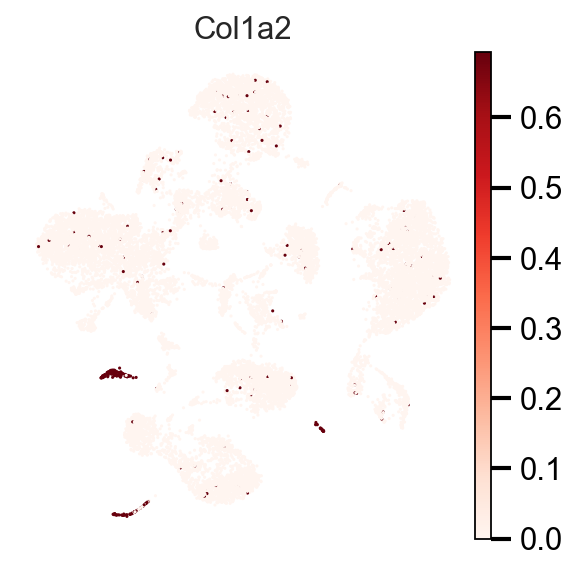





MYOFIBROBLASTS:


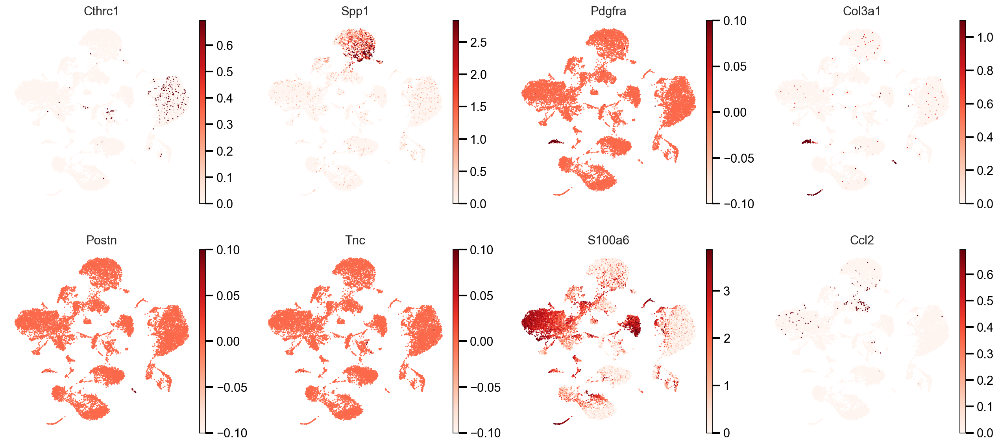





MACROPHAGES - MISHARIN:


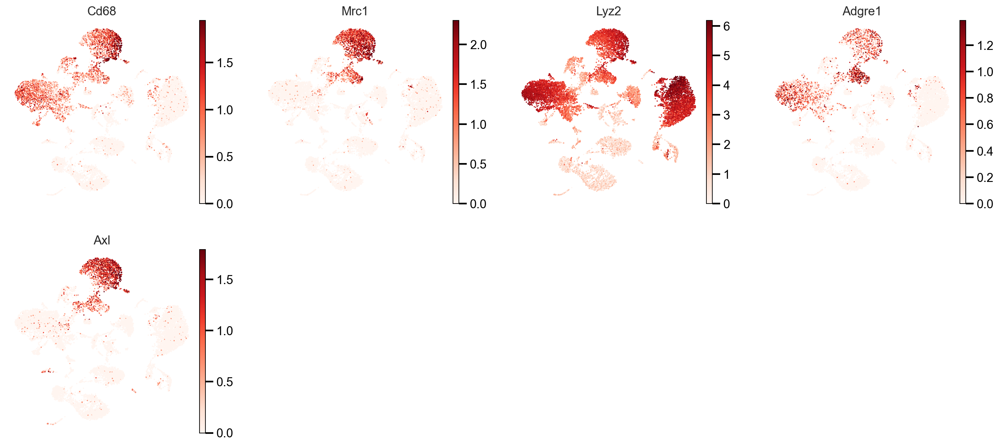





ALVEOLAR MACROPHAGES - MISHARIN:


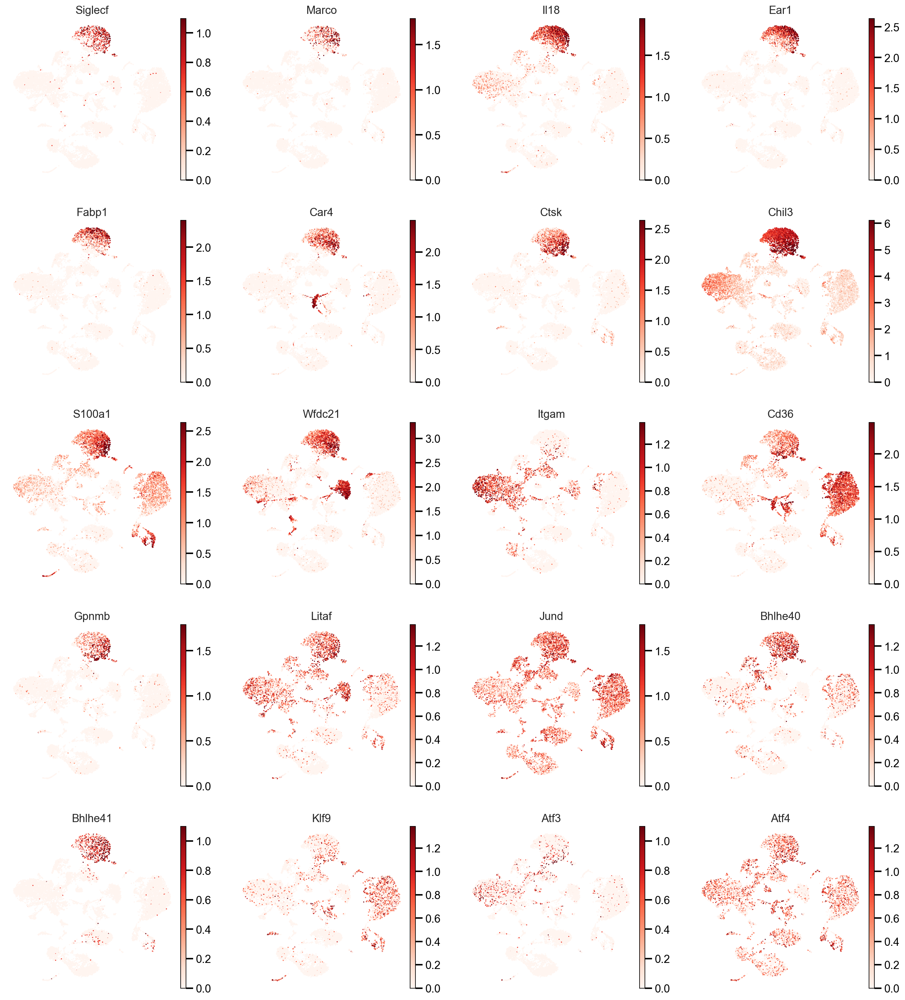

In [32]:
for ct in take_a_further_look:   #marker_genes_in_data.keys():
    print(f"{ct.upper()}:")  # print cell subtype name
    scanpy.pl.umap(
        misharin_filtered,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

In [8]:
cl_annotation_fine = {
	"0": "AT2",
    "1": "Classical monocytes",
    "2": "Alveolar macrophages",
    "3": "T-cells",
    "4": "B-cells",
    "5": "Non-classical macrophages",
    "6": "Interstitial macrophages",
    "7": "Neutrophil",
    "8": "NK-cells",
    "9": "Transitioning epi",   # + Club (left side of cluster) + Cilated (right side of the cluster)
    "10": "Neutrophil",
    "11": "Dendritic",
    "12": "Aerocyte",
    "13": "Endothelial",
    "14": "Myofibroblasts",
    "15": "CCR7 dendritic",
    "16": "Fibroblasts",
    "17": "AT1",
    "18": "Alveolar macrophages",
    "19": "19"
}

In [9]:
misharin_filtered.obs["manual_celltype_annotation_fine"] = misharin_filtered.obs.leiden_res0_25.map(
    cl_annotation_fine).astype("category")

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: PendingDeprecationWarning: The get_cmap function will be deprecated in a future version. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


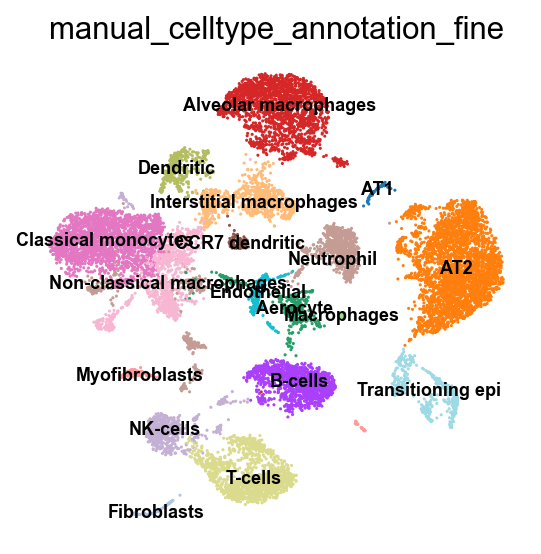

In [19]:
scanpy.pl.umap(misharin_filtered, color="manual_celltype_annotation_fine", legend_loc="on data", legend_fontsize="xx-small")

## Using differentially expressed genes to annotate the remaining clusters:

In [8]:
misharin_filtered.uns['log1p']["base"] = None

In [9]:
# coarse annotation:
scanpy.tl.rank_genes_groups(
    misharin_filtered, groupby="leiden_res0_1", method="wilcoxon", key_added="dea_leiden_0_1"
)

In [10]:
scanpy.tl.filter_rank_genes_groups(
    misharin_filtered, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="dea_leiden_0_1",
    key_added="dea_leiden_0_1_filtered",
)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


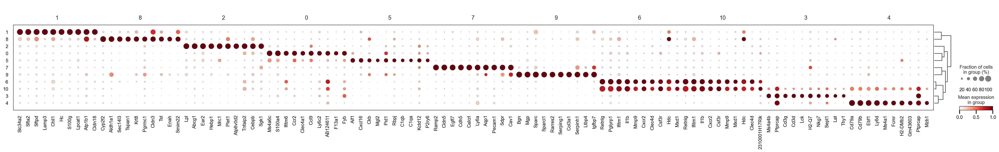

In [67]:
scanpy.pl.rank_genes_groups_dotplot(
    misharin_filtered, groupby="leiden_res0_1", standard_scale="var", n_genes=10, key="dea_leiden_0_1_filtered",
)

### Unannotated clusters - coarse annotation:
**10:**
- Retnlg, Ifitm1, Il1b, Cxcr2, Csf3r
- Conclusion: Neutrophil

In [11]:
cl_annotation_coarse = {
    "0": "Monocytes",
    "1": "AT2",
    "2": "Macrophages",
    "3": "T-cells",
    "4": "B-cells",
    "5": "Macrophages",
    "6": "AT1",  # only the small part ?
    "7": "Endothelial",
    "8": "Krt8",
    "9": "Fibroblasts",  # + Myofibroblasts ?
    "10": "Neutrophil"   # -> annotated by using differentially expressed genes
}

In [12]:
misharin_filtered.obs["manual_celltype_annotation_coarse"] = misharin_filtered.obs.leiden_res0_1.map(
    cl_annotation_coarse).astype("category")

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: PendingDeprecationWarning: The get_cmap function will be deprecated in a future version. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


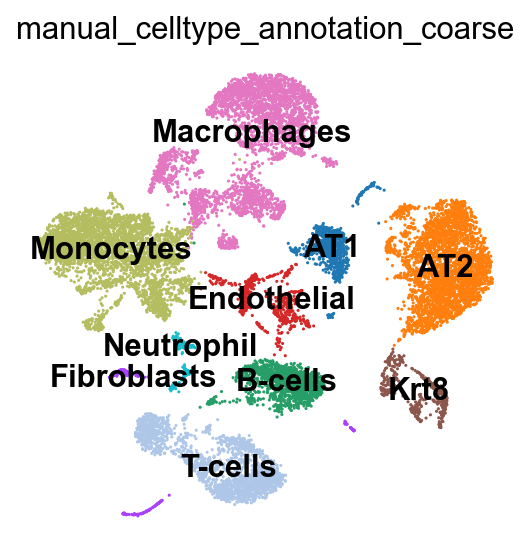

In [13]:
scanpy.pl.umap(misharin_filtered, color="manual_celltype_annotation_coarse", legend_loc="on data")

In [55]:
# fine annotation:
scanpy.tl.rank_genes_groups(
    misharin_filtered, groupby="leiden_res0_25", method="wilcoxon", key_added="dea_leiden_0_25"
)

In [56]:
scanpy.tl.filter_rank_genes_groups(
    misharin_filtered, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="dea_leiden_0_25",
    key_added="dea_leiden_0_25_filtered",
)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


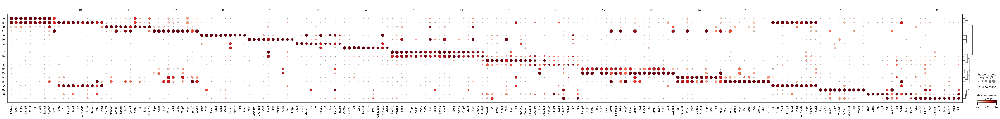

In [66]:
scanpy.pl.rank_genes_groups_dotplot(
    misharin_filtered, groupby="leiden_res0_25", standard_scale="var", n_genes=10, key="dea_leiden_0_25_filtered",
)

### Unannotated clusters - fine annotation:
**19:**
- Ccl3, Cd200r3, Cyp11a1, Cd7, Ifitm1
- Conclusion: Macrophages

In [14]:
cl_annotation_fine = {
    "0": "AT2",
    "1": "Classical monocytes",
    "2": "Alveolar macrophages",
    "3": "T-cells",
    "4": "B-cells",
    "5": "Non-classical macrophages",
    "6": "Interstitial macrophages",
    "7": "Neutrophil",
    "8": "NK-cells",
    "9": "Transitioning epi",  # + Club (left side of cluster) + Cilated (right side of the cluster)
    "10": "Neutrophil",
    "11": "Dendritic",
    "12": "Aerocyte",
    "13": "Endothelial",
    "14": "Myofibroblasts",
    "15": "CCR7 dendritic",
    "16": "Fibroblasts",
    "17": "AT1",
    "18": "Alveolar macrophages",
    "19": "Macrophages"   # -> annotated by using differentially expressed genes
}

In [15]:
misharin_filtered.obs["manual_celltype_annotation_fine"] = misharin_filtered.obs.leiden_res0_25.map(
    cl_annotation_fine).astype("category")

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: PendingDeprecationWarning: The get_cmap function will be deprecated in a future version. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


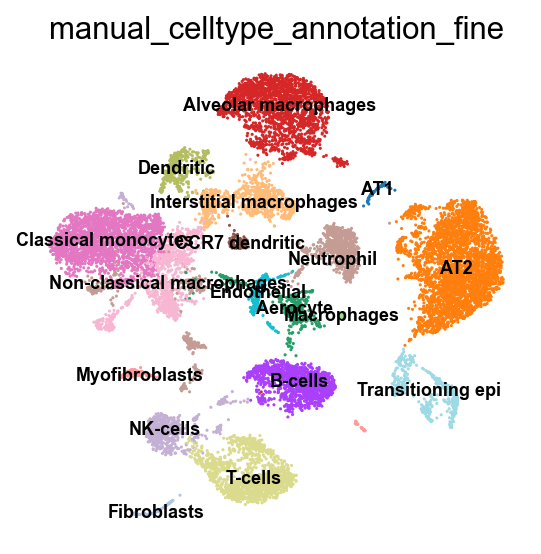

In [16]:
scanpy.pl.umap(misharin_filtered, color="manual_celltype_annotation_fine", legend_loc="on data", legend_fontsize="xx-small")

## Additional dotplot (fine annotation):

In [20]:
dotplot_markers = {
    ct: [m for m in ct_markers if m in misharin_filtered.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in marker_genes_in_data.keys()
}

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


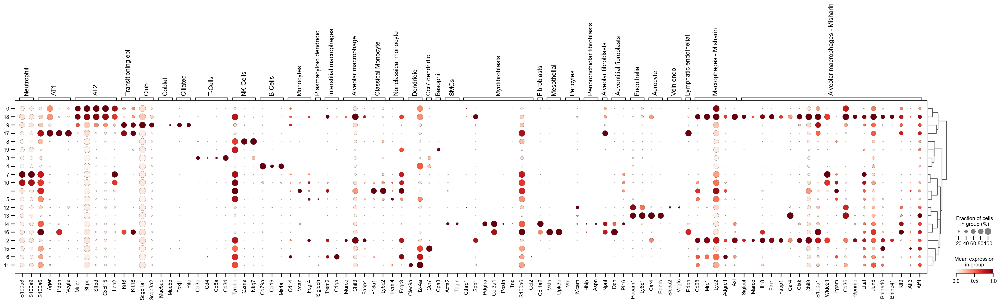

In [24]:
scanpy.pl.dotplot(
    misharin_filtered,
    groupby="leiden_res0_25",
    var_names=dotplot_markers,
    standard_scale="var",
    dendrogram=True
)

## Having a look at Daniel's annotation:

In [68]:
misharin_Daniel = scanpy.read(base + '/processed.h5ad')

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/anndata/_io/specs/registry.py:235: OldFormatWarning: Element '/X' was written without encoding metadata.
  return self.callback(read_func, elem.name, elem, iospec=get_spec(elem))
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/anndata/_io/specs/registry.py:235: OldFormatWarning: Element '/layers' was written without encoding metadata.
  return self.callback(read_func, elem.name, elem, iospec=get_spec(elem))
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/anndata/_io/specs/registry.py:235: OldFormatWarning: Element '/layers/counts' was written without encoding metadata.
  return self.callback(read_func, elem.name, elem, iospec=get_spec(elem))
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/anndata/_io/h5ad.py:280: OldFormatWarning: '/obs' was written with a very old version of AnnData. Consider rewriting it.
  warn(
/Libr

In [69]:
misharin_Daniel.obs.louvain.value_counts()   # Daniel's annotation (Louvain)

AT2                         3038
Monocytes                   2069
alveolar macrophages        1929
b-cells                     1401
t-cells1                    1349
5                            985
neutrophils                  823
dendridic1                   765
interstitial macrophages     574
t-cells2                     489
neutrophils2                 442
club cells                   335
endothelial1                 279
endothelial2                 223
AT2_2                        182
fibroblasts                  159
pDC                          103
dendridic2                    91
mesothelial                   68
AT1                           61
Name: louvain, dtype: int64

In [72]:
misharin_filtered.obs.manual_celltype_annotation_fine.value_counts()   # our annotation (Leiden 0.25)

AT2                          3210
Classical monocytes          2248
Alveolar macrophages         1963
T-cells                      1398
B-cells                      1334
Neutrophil                   1139
Non-classical macrophages     949
Interstitial macrophages      801
NK-cells                      569
Transitioning epi             446
Dendritic                     375
Aerocyte                      321
Endothelial                   238
Myofibroblasts                128
CCR7 dendritic                 94
Fibroblasts                    69
AT1                            66
Macrophages                    17
Name: manual_celltype_annotation_fine, dtype: int64

## Saving the annotated file:

In [17]:
misharin_filtered.write(output + "misharin_Emma_processed_annotated_leiden.h5ad")